# Visualize your Neural network with explainable AI with Shap, Tensorboard,whatif Tool for Hotel Booking classification problem

Note: We recommend running this tutorial in a Colab notebook, with no setup required!  Just click "Run in Google Colab".

<div class="devsite-table-wrapper"><table class="tfo-notebook-buttons" align="left">
<td><a target="_blank" href="https://www.tensorflow.org/tfx/tutorials/tfx/components">
<img src="https://www.tensorflow.org/images/tf_logo_32px.png" />View on TensorFlow.org</a></td>
<td><a target="_blank" href="https://colab.research.google.com/github/tensorflow/tfx/blob/master/docs/tutorials/tfx/components.ipynb">
<img src="https://www.tensorflow.org/images/colab_logo_32px.png">Run in Google Colab</a></td>
<td><a target="_blank" href="https://github.com/tensorflow/tfx/tree/master/docs/tutorials/tfx/components.ipynb">
<img width=32px src="https://www.tensorflow.org/images/GitHub-Mark-32px.png">View source on GitHub</a></td>
</table></div>

## Install Library & data loading

In [1]:
!pip install shap

     |████████████████████████████████| 276kB 2.8MB/s 
  Created wheel for shap: filename=shap-0.35.0-cp36-cp36m-linux_x86_64.whl size=394128 sha256=94d948170303d67f55cb856732f7359b817c6c25ce763cb1be54fc562b18eb30
  Stored in directory: /root/.cache/pip/wheels/e7/f7/0f/b57055080cf8894906b3bd3616d2fc2bfd0b12d5161bcb24ac
Successfully built shap


In [0]:
import pandas as pd
import numpy as np
import tensorflow as tf
import functools
from pprint import pprint
import lightgbm as lgb
import matplotlib.pyplot as plt
import numpy as np
import pickle
import shap
from sklearn.model_selection import train_test_split, StratifiedKFold
import warnings
from sklearn.preprocessing import LabelEncoder


In [20]:
data=pd.read_csv("hotel_bookings.csv")
data.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


In [21]:
data.fillna(0, inplace=True)
data.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,0.0,0.0,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,0.0,0.0,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,0.0,0.0,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,0.0,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,0.0,0,Transient,98.0,0,1,Check-Out,2015-07-03


In [22]:
data.is_canceled.value_counts()

0    75166
1    44224
Name: is_canceled, dtype: int64

In [23]:
data.isna().sum()

hotel                             0
is_canceled                       0
lead_time                         0
arrival_date_year                 0
arrival_date_month                0
arrival_date_week_number          0
arrival_date_day_of_month         0
stays_in_weekend_nights           0
stays_in_week_nights              0
adults                            0
children                          0
babies                            0
meal                              0
country                           0
market_segment                    0
distribution_channel              0
is_repeated_guest                 0
previous_cancellations            0
previous_bookings_not_canceled    0
reserved_room_type                0
assigned_room_type                0
booking_changes                   0
deposit_type                      0
agent                             0
company                           0
days_in_waiting_list              0
customer_type                     0
adr                         

In [24]:
data.fillna(0, inplace=True)
data.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,0.0,0.0,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,0.0,0.0,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,0.0,0.0,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,0.0,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,0.0,0,Transient,98.0,0,1,Check-Out,2015-07-03


In [25]:
features = ["lead_time","arrival_date_week_number","arrival_date_day_of_month",
                "stays_in_weekend_nights","stays_in_week_nights","adults","children",
                "babies","is_repeated_guest", "previous_cancellations",
                "previous_bookings_not_canceled","agent","company",
                "required_car_parking_spaces", "total_of_special_requests", "adr","hotel","arrival_date_month","meal","market_segment",
                "distribution_channel","reserved_room_type","deposit_type","customer_type",'is_canceled']


Raw_Data=data[features]
Raw_Data.head()

,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,agent,company,required_car_parking_spaces,total_of_special_requests,adr,hotel,arrival_date_month,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,is_canceled
0,342,27,1,0,0,2,0.0,0,0,0,0,0.0,0.0,0,0,0.0,Resort Hotel,July,BB,Direct,Direct,C,No Deposit,Transient,0
1,737,27,1,0,0,2,0.0,0,0,0,0,0.0,0.0,0,0,0.0,Resort Hotel,July,BB,Direct,Direct,C,No Deposit,Transient,0
2,7,27,1,0,1,1,0.0,0,0,0,0,0.0,0.0,0,0,75.0,Resort Hotel,July,BB,Direct,Direct,A,No Deposit,Transient,0
3,13,27,1,0,1,1,0.0,0,0,0,0,304.0,0.0,0,0,75.0,Resort Hotel,July,BB,Corporate,Corporate,A,No Deposit,Transient,0
4,14,27,1,0,2,2,0.0,0,0,0,0,240.0,0.0,0,1,98.0,Resort Hotel,July,BB,Online TA,TA/TO,A,No Deposit,Transient,0


In [0]:
X = Raw_Data.drop(["is_canceled"], axis=1)
y = Raw_Data["is_canceled"]

In [0]:
X_display =X.copy()
y_display = y.copy()

In [46]:
X_new=X.copy()
X_new.head()

,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,agent,company,required_car_parking_spaces,total_of_special_requests,adr,hotel,arrival_date_month,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type
0,342,27,1,0,0,2,0.0,0,0,0,0,0.0,0.0,0,0,0.0,Resort Hotel,July,BB,Direct,Direct,C,No Deposit,Transient
1,737,27,1,0,0,2,0.0,0,0,0,0,0.0,0.0,0,0,0.0,Resort Hotel,July,BB,Direct,Direct,C,No Deposit,Transient
2,7,27,1,0,1,1,0.0,0,0,0,0,0.0,0.0,0,0,75.0,Resort Hotel,July,BB,Direct,Direct,A,No Deposit,Transient
3,13,27,1,0,1,1,0.0,0,0,0,0,304.0,0.0,0,0,75.0,Resort Hotel,July,BB,Corporate,Corporate,A,No Deposit,Transient
4,14,27,1,0,2,2,0.0,0,0,0,0,240.0,0.0,0,1,98.0,Resort Hotel,July,BB,Online TA,TA/TO,A,No Deposit,Transient


## Feature Transformation for model Training

In [29]:
X.dtypes

lead_time                           int64
arrival_date_week_number            int64
arrival_date_day_of_month           int64
stays_in_weekend_nights             int64
stays_in_week_nights                int64
adults                              int64
children                          float64
babies                              int64
is_repeated_guest                   int64
previous_cancellations              int64
previous_bookings_not_canceled      int64
agent                             float64
company                           float64
required_car_parking_spaces         int64
total_of_special_requests           int64
adr                               float64
hotel                              object
arrival_date_month                 object
meal                               object
market_segment                     object
distribution_channel               object
reserved_room_type                 object
deposit_type                       object
customer_type                     

In [0]:
def transform_categorical():
  s = (X.dtypes == 'object')
  object_cols = list(s[s].index)
  print(object_cols)
  for i in object_cols:
    lb_make = LabelEncoder()  
    X[i] = lb_make.fit_transform(X[i])
  #for i in object_cols:
   # X[i] = X[i].astype(float)
  return X

In [48]:
X=transform_categorical()
X.head()

['hotel', 'arrival_date_month', 'meal', 'market_segment', 'distribution_channel', 'reserved_room_type', 'deposit_type', 'customer_type']


,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,agent,company,required_car_parking_spaces,total_of_special_requests,adr,hotel,arrival_date_month,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type
0,342,27,1,0,0,2,0.0,0,0,0,0,0.0,0.0,0,0,0.0,1,5,0,3,1,2,0,2
1,737,27,1,0,0,2,0.0,0,0,0,0,0.0,0.0,0,0,0.0,1,5,0,3,1,2,0,2
2,7,27,1,0,1,1,0.0,0,0,0,0,0.0,0.0,0,0,75.0,1,5,0,3,1,0,0,2
3,13,27,1,0,1,1,0.0,0,0,0,0,304.0,0.0,0,0,75.0,1,5,0,2,0,0,0,2
4,14,27,1,0,2,2,0.0,0,0,0,0,240.0,0.0,0,1,98.0,1,5,0,6,3,0,0,2


In [49]:

X.dtypes

lead_time                           int64
arrival_date_week_number            int64
arrival_date_day_of_month           int64
stays_in_weekend_nights             int64
stays_in_week_nights                int64
adults                              int64
children                          float64
babies                              int64
is_repeated_guest                   int64
previous_cancellations              int64
previous_bookings_not_canceled      int64
agent                             float64
company                           float64
required_car_parking_spaces         int64
total_of_special_requests           int64
adr                               float64
hotel                               int64
arrival_date_month                  int64
meal                                int64
market_segment                      int64
distribution_channel                int64
reserved_room_type                  int64
deposit_type                        int64
customer_type                     

## Train Test Split

In [0]:
def data_split():
  random_state = 7
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=random_state) 
  return X_train, X_test, y_train, y_test

In [0]:
X_train, X_test, y_train, y_test=data_split()

In [54]:
X_train.shape

(95512, 24)

## Light GBM model

In [0]:
# create a train/test split
d_train = lgb.Dataset(X_train, label=y_train)
d_test = lgb.Dataset(X_test, label=y_test)

In [56]:
random_state=7
params = {
    "max_bin": 512,
    "learning_rate": 0.05,
    "boosting_type": "gbdt",
    "objective": "binary",
    "metric": "binary_logloss",
    "num_leaves": 10,
    "verbose": -1,
    "min_data": 100,
    "boost_from_average": True,
    "random_state": random_state
}

model = lgb.train(params, d_train, 10000, valid_sets=[d_test], early_stopping_rounds=50, verbose_eval=1000)

Training until validation scores don't improve for 50 rounds.
[1000]	valid_0's binary_logloss: 0.344903
[2000]	valid_0's binary_logloss: 0.334606
[3000]	valid_0's binary_logloss: 0.32872
[4000]	valid_0's binary_logloss: 0.325002
[5000]	valid_0's binary_logloss: 0.322382
Early stopping, best iteration is:
[5889]	valid_0's binary_logloss: 0.320531


## Calculate SHAP values
Compute SHAP values and SHAP interaction values for the first 20 test observations.

In [57]:
explainer = shap.TreeExplainer(model)
expected_value = explainer.expected_value
if isinstance(expected_value, list):
    expected_value = expected_value[1]
print(f"Explainer expected value: {expected_value}")

select = range(20)
features = X_test.iloc[select]
features_display = X_display.loc[features.index]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    shap_values = explainer.shap_values(features)[1]
    shap_interaction_values = explainer.shap_interaction_values(features)
if isinstance(shap_interaction_values, list):
    shap_interaction_values = shap_interaction_values[1]

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


Explainer expected value: [-0.22869578]


## SHAP Summary Plot
Rather than use a typical feature importance bar chart, we use a density scatter plot of SHAP values for each feature to identify how much impact each feature has on the model output for individuals in the validation dataset. Features are sorted by the sum of the SHAP value magnitudes across all samples. 
Note that when the scatter points don't fit on a line they pile up to show density, and the color of each point represents the feature value of that individual.
In 

In [0]:
#shap_values_log = explainer.shap_values(X)
#shap.summary_plot(shap_values_log, X)

## Basic decision plot features
Refer to the decision plot of the 20 test observations below. Note: This plot isn't informative by itself; we use it only to illustrate the primary concepts.

*   The x-axis represents the model's output. In this case, the units are log odds.
*   The plot is centered on the x-axis at explainer.expected_value. All SHAP values are relative to the model's expected value like a linear model's effects are relative to the intercept.
*  The y-axis lists the model's features. By default, the features are ordered by descending importance. The importance is calculated over the observations plotted. This is usually different than the importance ordering for the entire dataset. In addition to feature importance ordering, the decision plot also supports hierarchical cluster feature ordering and user-defined feature ordering.
*   Each observation's prediction is represented by a colored line. At the top of the plot, each line strikes the x-axis at its corresponding observation's predicted value. This value determines the color of the line on a spectrum.
*   
Moving from the bottom of the plot to the top, SHAP values for each feature are added to the model's base value. This shows how each feature contributes to the overall prediction.
*   At the bottom of the plot, the observations converge at explainer.expected_value.





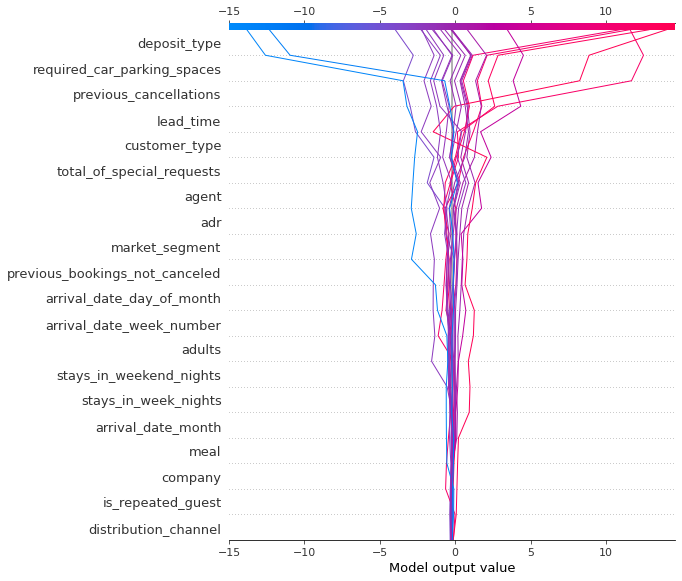

In [58]:
shap.decision_plot(expected_value, shap_values, features_display)

Like the force plot, the decision plot supports link='logit' to transform log odds to probabilities.

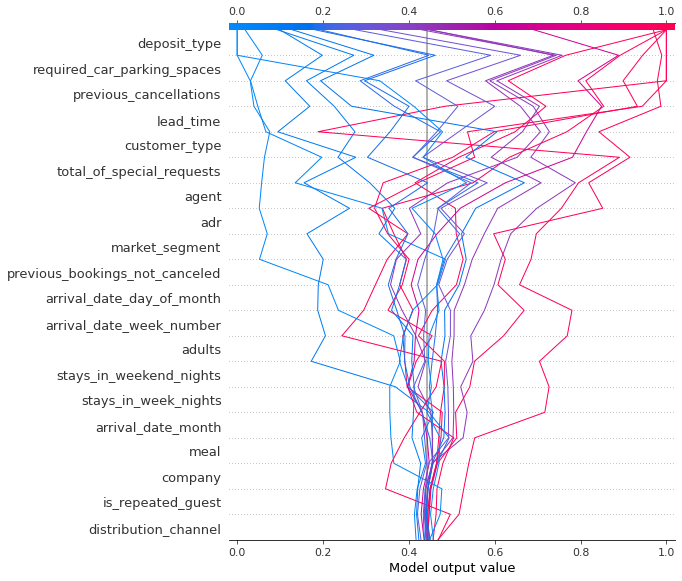

In [59]:
shap.decision_plot(expected_value, shap_values, features_display, link='logit')

In [60]:
(shap_values.sum(1) + expected_value) > 0

array([False,  True, False, False,  True,  True,  True, False,  True,
        True, False,  True, False, False, False, False, False, False,
       False, False])

Observations can be highlighted using a dotted line style. Here, we highlight a misclassified observation.

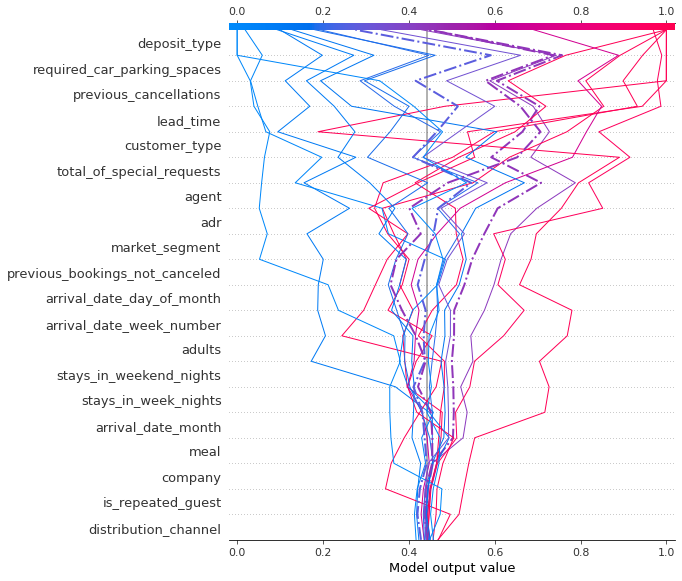

In [61]:
# Our naive cutoff point is zero log odds (probability 0.5).
y_pred = (shap_values.sum(1) + expected_value) > 0
misclassified = y_pred != y_test[:20]
shap.decision_plot(expected_value, shap_values, features_display, link='logit', highlight=misclassified)

Let's inspect the misclassified observation by plotting it alone. When a single observation is plotted, its corresponding feature values are displayed. Notice that the shape of the line has changed. Why? The feature order has changed on the y-axis based on the feature importance for this lone observation. The section "Preserving order and scale between plots" shows how to use the same feature order for multiple plots.

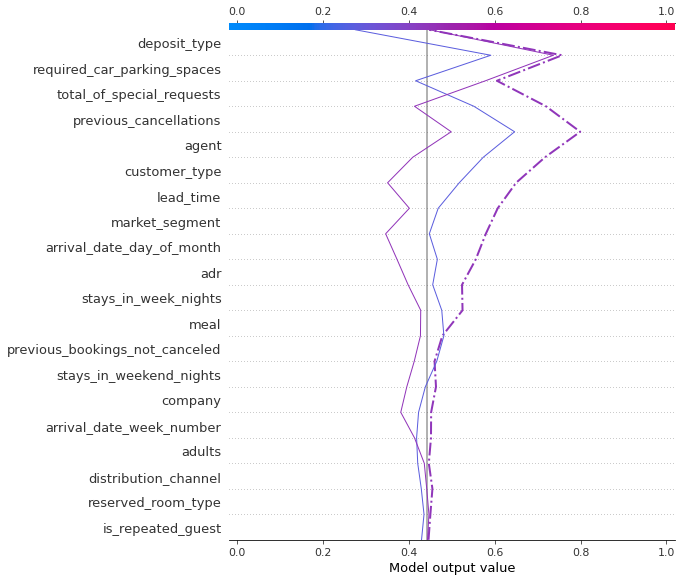

In [62]:
shap.decision_plot(expected_value, shap_values[misclassified], features_display[misclassified],
                   link='logit', highlight=0)


A force plot for the misclassified observation is shown below. In this case, the decision plot and the force plot are both effective at showing how the model arrived at its decision.

In [63]:
%matplotlib inline
shap.initjs()
shap.force_plot(expected_value, shap_values[misclassified], features_display[misclassified], 
                link='logit', matplotlib=False,show=True)


## Display the cumulative effect of interactions
Decision plots support SHAP interaction values: the first-order interactions estimated from tree-based models. While SHAP dependence plots are the best way to visualize individual interactions, a decision plot can display the cumulative effect of main effects and interactions for one or more observations.

The decision plot here explains a single prediction from the UCI Adult Income data set using both main effects and interactions. The 20 most important features are displayed. For more details relating to support for interactions, see the section "SHAP interaction values."

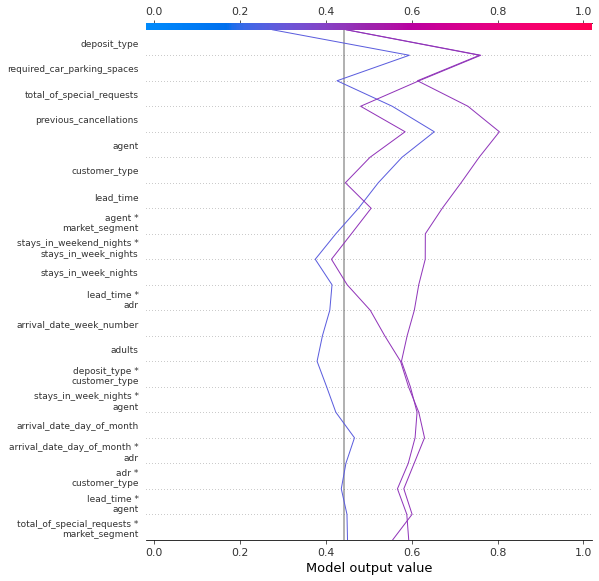

In [64]:
shap.decision_plot(expected_value, shap_interaction_values[misclassified], features_display[misclassified],
                   link='logit')

## Explore feature effects for a range of feature values
A decision plot can reveal how predictions change across a set of feature values. This method is useful for presenting hypothetical scenarios and exposing model behaviors.

In [65]:
idx = 36
X_display.loc[idx]

lead_time                                   15
arrival_date_week_number                    27
arrival_date_day_of_month                    2
stays_in_weekend_nights                      1
stays_in_week_nights                         3
adults                                       2
children                                     0
babies                                       0
is_repeated_guest                            0
previous_cancellations                       0
previous_bookings_not_canceled               0
agent                                      240
company                                      0
required_car_parking_spaces                  0
total_of_special_requests                    0
adr                                         98
hotel                             Resort Hotel
arrival_date_month                        July
meal                                        BB
market_segment                       Online TA
distribution_channel                     TA/TO
reserved_room

In [0]:
rg = range(0, 10100, 100)
R = X.iloc[np.repeat(idx, len(rg))].reset_index(drop=True)
R['lead_time'] = rg

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    hypothetical_shap_values = explainer.shap_values(R)[1]
    
hypothetical_predictions = expected_value + hypothetical_shap_values.sum(axis=1)
hypothetical_predictions = 1 / (1 + np.exp(-hypothetical_predictions))

This dependence plot shows the change in SHAP values across a feature's value range. The SHAP values for this model represent a change in log odds. 

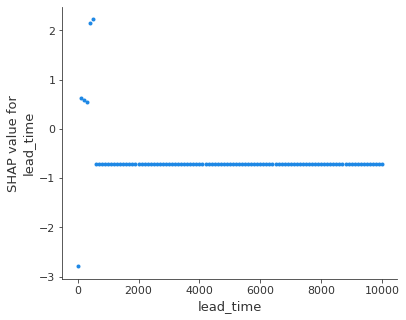

In [67]:
shap.dependence_plot('lead_time', hypothetical_shap_values, R, interaction_index=None)

Though the dependence plot is helpful, it is difficult to discern the practical effects of the SHAP values in context. For that purpose, we can plot the synthetic data set with a decision plot on the probability scale. First, we plot the reference observation to establish context. 

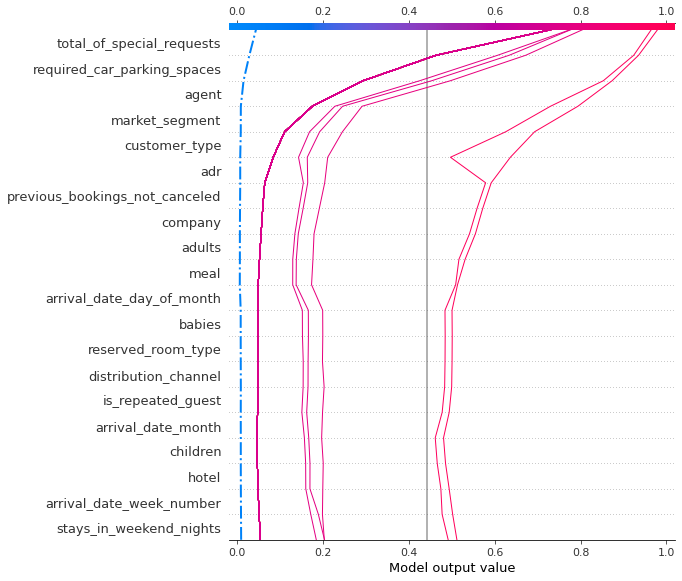

In [68]:

shap.decision_plot(expected_value, hypothetical_shap_values, R, link='logit', feature_order='hclust', highlight=0)

# Advance Visualization for Tensorflow Model with Tensorboard & What-IF

In [69]:
try:
  import google.colab
  !pip install --upgrade witwidget
except:
  pass

     |████████████████████████████████| 2.3MB 2.7MB/s 


## Utility helper functions

In [0]:

import pandas as pd
import numpy as np
import tensorflow as tf
import functools

# Creates a tf feature spec from the dataframe and columns specified.
def create_feature_spec(df, columns=None):
    feature_spec = {}
    if columns == None:
        columns = df.columns.values.tolist()
    for f in columns:
        if df[f].dtype is np.dtype(np.int64):
            feature_spec[f] = tf.io.FixedLenFeature(shape=(), dtype=tf.int64)
        elif df[f].dtype is np.dtype(np.float64):
            feature_spec[f] = tf.io.FixedLenFeature(shape=(), dtype=tf.float32)
        else:
            feature_spec[f] = tf.io.FixedLenFeature(shape=(), dtype=tf.string)
    return feature_spec

# Creates simple numeric and categorical feature columns from a feature spec and a
# list of columns from that spec to use.
#
# NOTE: Models might perform better with some feature engineering such as bucketed
# numeric columns and hash-bucket/embedding columns for categorical features.
def create_feature_columns(columns, feature_spec):
    ret = []
    for col in columns:
        if feature_spec[col].dtype is tf.int64 or feature_spec[col].dtype is tf.float32:
            ret.append(tf.feature_column.numeric_column(col))
        else:
            ret.append(tf.feature_column.indicator_column(
                tf.feature_column.categorical_column_with_vocabulary_list(col, list(xTrain[col].unique()))))
    return ret

# An input function for providing input to a model from tf.Examples
def tfexamples_input_fn(examples, feature_spec, label, mode=tf.estimator.ModeKeys.EVAL,
                       num_epochs=None, 
                       batch_size=64):
    def ex_generator():
        for i in range(len(examples)):
            yield examples[i].SerializeToString()
    dataset = tf.data.Dataset.from_generator(
      ex_generator, tf.dtypes.string, tf.TensorShape([]))
    if mode == tf.estimator.ModeKeys.TRAIN:
        dataset = dataset.shuffle(buffer_size=2 * batch_size + 1)
    dataset = dataset.batch(batch_size)
    dataset = dataset.map(lambda tf_example: parse_tf_example(tf_example, label, feature_spec))
    dataset = dataset.repeat(num_epochs)
    return dataset

# Parses Tf.Example protos into features for the input function.
def parse_tf_example(example_proto, label, feature_spec):
    parsed_features = tf.io.parse_example(serialized=example_proto, features=feature_spec)
    target = parsed_features.pop(label)
    return parsed_features, target

# Converts a dataframe into a list of tf.Example protos.
def df_to_examples(df, columns=None):
    examples = []
    if columns == None:
        columns = df.columns.values.tolist()
    for index, row in df.iterrows():
        example = tf.train.Example()
        for col in columns:
            if df[col].dtype is np.dtype(np.int64):
                example.features.feature[col].int64_list.value.append(int(row[col]))
            elif df[col].dtype is np.dtype(np.float64):
                example.features.feature[col].float_list.value.append(row[col])
            elif row[col] == row[col]:
                example.features.feature[col].bytes_list.value.append(row[col].encode('utf-8'))
        examples.append(example)
    return examples

# Converts a dataframe column into a column of 0's and 1's based on the provided test.
# Used to force label columns to be numeric for binary classification using a TF estimator.
def make_label_column_numeric(df, label_column, test):
  df[label_column] = np.where(test(df[label_column]), 1, 0)

In [0]:
X = Raw_Data.drop(["is_canceled"], axis=1)
y = Raw_Data["is_canceled"]

In [0]:
from sklearn.model_selection import train_test_split
xTrain, xTest, yTrain, yTest = train_test_split(X, y, test_size = 0.2, random_state = 0)

In [73]:

xTrain['is_canceled']=yTrain
xTrain.reset_index(inplace=True,drop=True)
xTrain.head()



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,agent,company,required_car_parking_spaces,total_of_special_requests,adr,hotel,arrival_date_month,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,is_canceled
0,66,32,6,2,2,3,0.0,0,0,0,0,9.0,0.0,0,0,168.3,City Hotel,August,BB,Online TA,TA/TO,D,No Deposit,Transient,1
1,51,36,31,1,4,2,0.0,0,0,0,0,9.0,0.0,0,0,123.3,City Hotel,August,BB,Online TA,TA/TO,D,No Deposit,Transient,1
2,22,38,15,0,1,1,0.0,0,0,0,0,9.0,0.0,0,2,149.0,City Hotel,September,BB,Online TA,TA/TO,A,No Deposit,Transient,0
3,69,11,17,2,3,2,2.0,0,0,0,0,9.0,0.0,0,0,153.0,City Hotel,March,BB,Online TA,TA/TO,F,No Deposit,Transient,1
4,14,17,25,0,4,2,2.0,0,0,0,0,14.0,0.0,1,2,324.5,City Hotel,April,HB,Direct,Direct,G,No Deposit,Transient,0


## Specify input columns and column to predict

In [0]:

import numpy as np

# Set the column in the dataset you wish for the model to predict
label_column = 'is_canceled'


# Set list of all columns from the dataset we will use for model input.
input_features = [
  'lead_time', 'arrival_date_week_number', 'arrival_date_day_of_month',
       'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children',
       'babies', 'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'agent', 'company',
       'required_car_parking_spaces', 'total_of_special_requests', 'adr',
       'hotel', 'arrival_date_month', 'meal', 'market_segment',
       'distribution_channel', 'reserved_room_type', 'deposit_type',
       'customer_type']

# Create a list containing all input features and the label column
features_and_labels = input_features + [label_column]

## Convert dataset to tf.Example protos

In [0]:
examples = df_to_examples(xTrain)

## Create and train the linear classifier

In [76]:
num_steps = 2000  

# Create a feature spec for the classifier
feature_spec = create_feature_spec(xTrain, features_and_labels)
feature_spec


{'adr': FixedLenFeature(shape=(), dtype=tf.float32, default_value=None),
 'adults': FixedLenFeature(shape=(), dtype=tf.int64, default_value=None),
 'agent': FixedLenFeature(shape=(), dtype=tf.float32, default_value=None),
 'arrival_date_day_of_month': FixedLenFeature(shape=(), dtype=tf.int64, default_value=None),
 'arrival_date_month': FixedLenFeature(shape=(), dtype=tf.string, default_value=None),
 'arrival_date_week_number': FixedLenFeature(shape=(), dtype=tf.int64, default_value=None),
 'babies': FixedLenFeature(shape=(), dtype=tf.int64, default_value=None),
 'children': FixedLenFeature(shape=(), dtype=tf.float32, default_value=None),
 'company': FixedLenFeature(shape=(), dtype=tf.float32, default_value=None),
 'customer_type': FixedLenFeature(shape=(), dtype=tf.string, default_value=None),
 'deposit_type': FixedLenFeature(shape=(), dtype=tf.string, default_value=None),
 'distribution_channel': FixedLenFeature(shape=(), dtype=tf.string, default_value=None),
 'hotel': FixedLenFeature

In [0]:
# Define and train the classifier
train_inpf = functools.partial(tfexamples_input_fn, examples, feature_spec, label_column)
train_inpf

In [0]:
import datetime
!rm -rf ./tmp/ 

## Tensorflow Estimator Model

In [79]:
classifier = tf.estimator.LinearClassifier(
    feature_columns=create_feature_columns(input_features, feature_spec))
classifier.train(train_inpf, steps=num_steps)

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': '/tmp/tmplmg3f5o4', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_session_creation_timeout_secs': 7200, '_service': None, '_cluster_spec': ClusterSpec({}), '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Instructions for updating:
Use Varia

In [80]:
#title Create and train the DNN classifier {display-mode: "form"}
num_steps_2 = 2000  

classifier1 = tf.estimator.DNNClassifier(
    feature_columns=create_feature_columns(input_features, feature_spec),
    hidden_units=[128, 64, 32])

classifier1.train(train_inpf, steps=num_steps_2)

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': '/tmp/tmpdsixjqdc', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_session_creation_timeout_secs': 7200, '_service': None, '_cluster_spec': ClusterSpec({}), '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.


In [81]:
!kill 6110

/bin/bash: line 0: kill: (6110) - No such process


In [82]:
%load_ext tensorboard
%reload_ext tensorboard
%tensorboard --logdir=/tmp/

<IPython.core.display.Javascript object>

In [83]:
xTest['is_canceled']=yTest
xTest.reset_index(inplace=True,drop=True)
xTest.head()


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,agent,company,required_car_parking_spaces,total_of_special_requests,adr,hotel,arrival_date_month,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,is_canceled
0,354,19,6,2,5,2,0.0,0,0,0,0,40.0,0.0,0,0,37.56,Resort Hotel,May,BB,Offline TA/TO,TA/TO,A,No Deposit,Transient,0
1,142,35,31,0,3,2,0.0,0,0,0,0,85.0,0.0,0,0,86.10,City Hotel,August,BB,Online TA,TA/TO,A,No Deposit,Transient,0
2,304,34,17,1,1,2,0.0,0,0,1,0,1.0,0.0,0,0,62.00,City Hotel,August,BB,Groups,TA/TO,A,Non Refund,Transient-Party,1
3,5,22,28,2,2,2,0.0,0,0,0,0,9.0,0.0,0,1,133.10,City Hotel,May,BB,Online TA,TA/TO,D,No Deposit,Transient,0
4,313,35,26,0,2,2,0.0,0,0,1,0,1.0,0.0,0,0,62.00,City Hotel,August,BB,Groups,TA/TO,A,Non Refund,Transient-Party,1


In [0]:
# title Invoke What-If Tool for test data and the trained models {display-mode: "form"}

num_datapoints = 2000  
tool_height_in_px = 1000  

from witwidget.notebook.visualization import WitConfigBuilder
from witwidget.notebook.visualization import WitWidget

# Load up the test dataset
test_examples = df_to_examples(xTest[:2000])



In [86]:
# Setup the tool with the test examples and the trained classifier
config_builder = WitConfigBuilder(test_examples).set_estimator_and_feature_spec(
    classifier, feature_spec).set_compare_estimator_and_feature_spec(
    classifier1, feature_spec).set_label_vocab(['Check-Out','Canceled'])
a = WitWidget(config_builder, height=tool_height_in_px)